In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load



# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Installation

In [1]:
!pip install opencv-python-headless

In [2]:
!pip install numpy==1.22

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 65.1 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.3
    Uninstalling numpy-1.24.3:
      Successfully uninstalled numpy-1.24.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf 23.8.0 requires cupy-cuda11x>=12.0.0, which is not installed.
cuml 23.8.0 requires cupy-cuda11x>=12.0.0, which is not installed.
dask-cudf 23.8.0 requires cupy-cuda11x>=12.0.0, which is not installed.
apache-beam 2.46.0 requires dill<0.3.2,>=0.3.1.1, but you have dill 0.3.7 which is incompatible.
apache-beam 2.46.0 requires pyarrow<10.0.0,>=3.0.0, but you have pyarrow 11.0.0 which is incompatible.
chex 0.1.85 requires numpy>=1.24.1, but you have numpy 1.22.0 which is incompatible.
cudf 23.8.0 requires pandas<1.6.0dev0,>=1.3, but you have pandas 2.0.3 which is incompatible

In [3]:
!pip install --upgrade scikit-image

  Obtaining dependency information for scikit-image from https://files.pythonhosted.org/packages/f1/6c/49f5a0ce8ddcdbdac5ac69c129654938cc6de0a936303caa6cad495ceb2a/scikit_image-0.22.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.7/14.7 MB 68.3 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: scikit-image
    Found existing installation: scikit-image 0.21.0
    Uninstalling scikit-image-0.21.0:
      Successfully uninstalled scikit-image-0.21.0


In [4]:
!pip install keras-tuner

In [5]:
!pip install --upgrade scipy

# Dependencies

In [6]:
import os
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import cv2
import numpy as np
import pandas as pd
import shutil
import random

from random import sample
from PIL import Image
from skimage import feature
from sklearn.metrics import make_scorer, accuracy_score
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from keras_tuner.tuners import RandomSearch

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# EDA & Preprocessing

In [7]:
# Open an image file
img = Image.open('/kaggle/input/leaf-disease-detection-dataset/dataset/train/Apple___Apple_scab/00075aa8-d81a-4184-8541-b692b78d398a___FREC_Scab 3335.JPG')
# Get image size
width, height = img.size

print(f"The image width is {width} and the image height is {height}")

The image width is 256 and the image height is 256


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


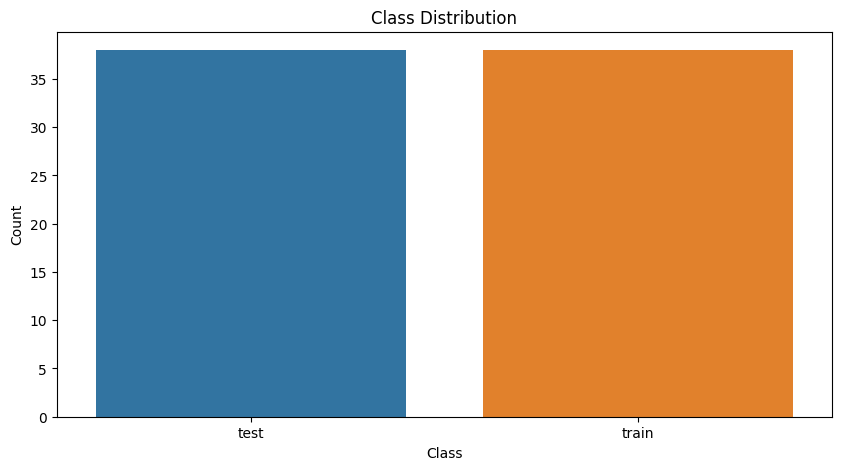

In [8]:
# Function to plot class distribution
def plot_class_distribution(directory):
    class_counts = [len(os.listdir(os.path.join(directory, class_folder))) for class_folder in os.listdir(directory)]
    class_labels = os.listdir(directory)
    
    plt.figure(figsize=(10, 5))
    sns.barplot(x=class_labels, y=class_counts)
    plt.title('Class Distribution')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.show()

# Define the path to your dataset
dataset_directory = '/kaggle/input/leaf-disease-detection-dataset/dataset'

# Plot class distribution
plot_class_distribution(dataset_directory)

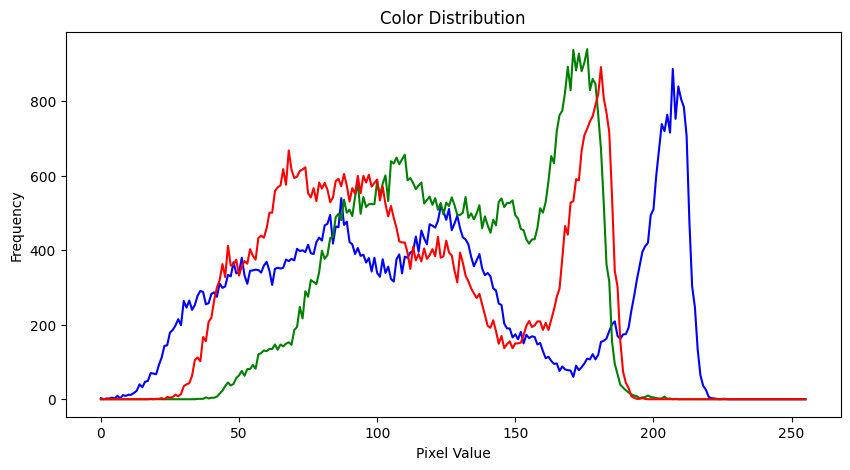

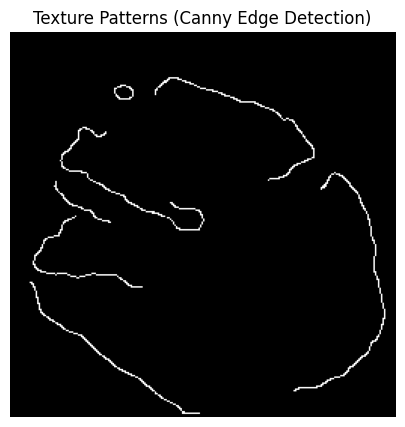

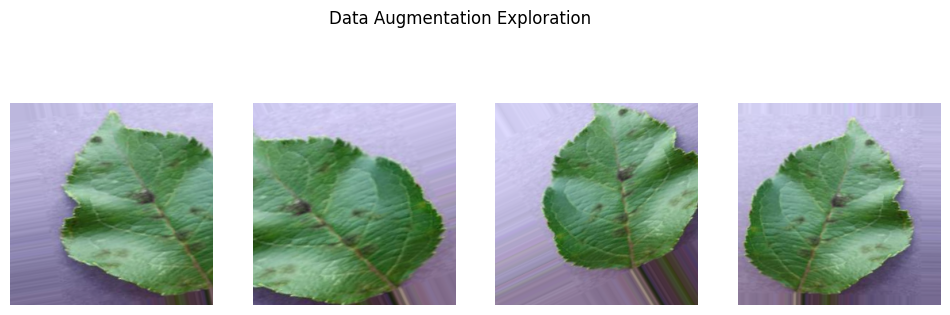

In [9]:
# Function to display color distribution
def display_color_distribution(img):
    colors = ('b', 'g', 'r')
    
    plt.figure(figsize=(10, 5))
    
    for i, color in enumerate(colors):
        hist = cv2.calcHist([img], [i], None, [256], [0, 256])
        plt.plot(hist, color=color)
    
    plt.title('Color Distribution')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.show()

# Function to display texture patterns
def display_texture_patterns(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    edges = feature.canny(gray, sigma=3)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(edges, cmap='gray')
    plt.title('Texture Patterns (Canny Edge Detection)')
    plt.axis('off')
    plt.show()

# Display color distribution and texture patterns for a sample image
sample_image_path = dataset_directory + '/train/Apple___Apple_scab/00075aa8-d81a-4184-8541-b692b78d398a___FREC_Scab 3335.JPG'  # you can change this path
sample_img = cv2.imread(sample_image_path)

display_color_distribution(sample_img)
print()
display_texture_patterns(sample_img)
print()

# Data augmentation exploration
augmentation_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Generate augmented images for a sample image
img = image.load_img(sample_image_path, target_size=(256, 256))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)

augmented_images = augmentation_datagen.flow(x, batch_size=1)

num_images = len(augmented_images)
num_images = max(num_images, 4)

plt.figure(figsize=(12, 4))
for i in range(num_images):
    plt.subplot(1, num_images, i + 1)
    img = np.squeeze(augmented_images[0])
    plt.imshow(image.array_to_img(img))
    plt.axis('off')

plt.suptitle('Data Augmentation Exploration')
plt.show()

In [10]:
train_dataset_path = dataset_directory+"/train"
test_dataset_path = dataset_directory+"/test"
batch_size = 32

In [11]:
# Preprocessing
# Set up image data generation with augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

test_datagen = ImageDataGenerator(rescale=1./255)

In [12]:
# Load the training set and validation sets
train_generator = train_datagen.flow_from_directory(
    train_dataset_path,
    target_size=(256, 256),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=42

)

validation_generator = test_datagen.flow_from_directory(
    test_dataset_path,
    target_size=(256, 256),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

Found 70295 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.


----------------------------Sample Images from Training Set-------------------------------------


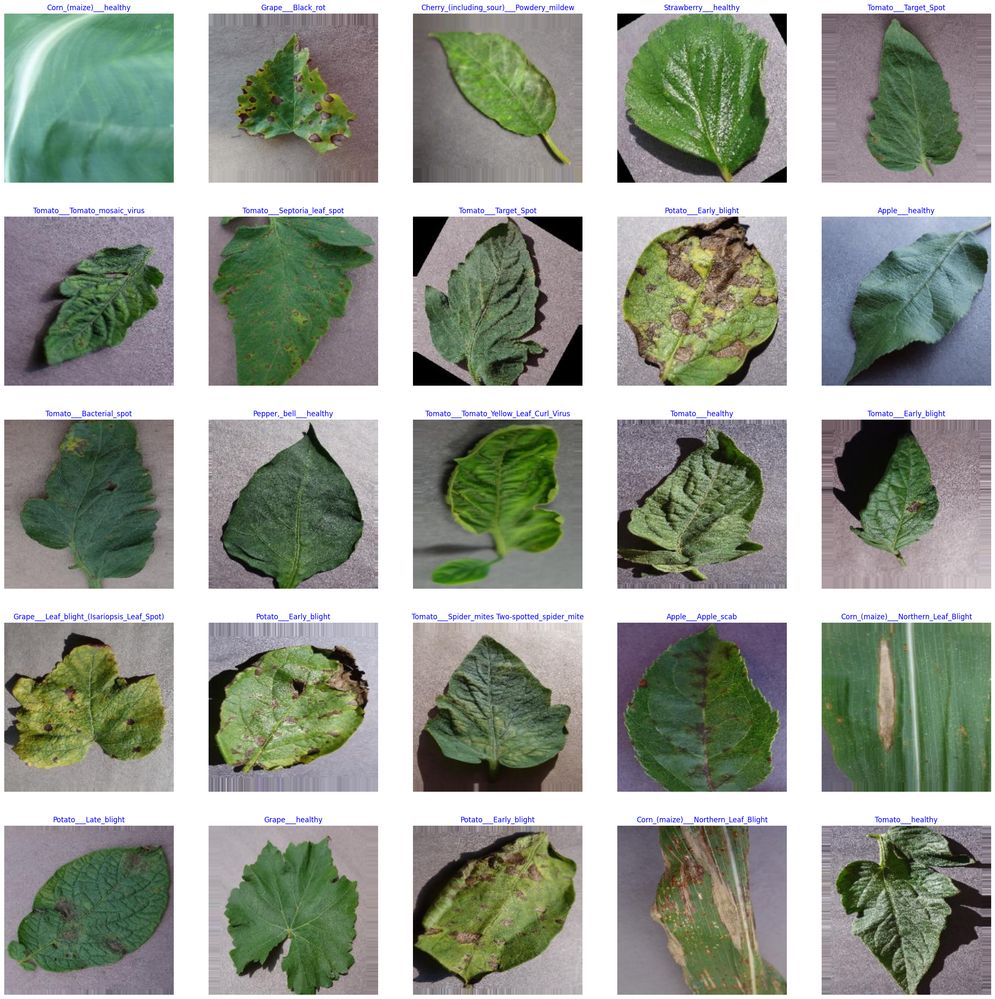

----------------------------Sample Images from Validation Set-------------------------------------


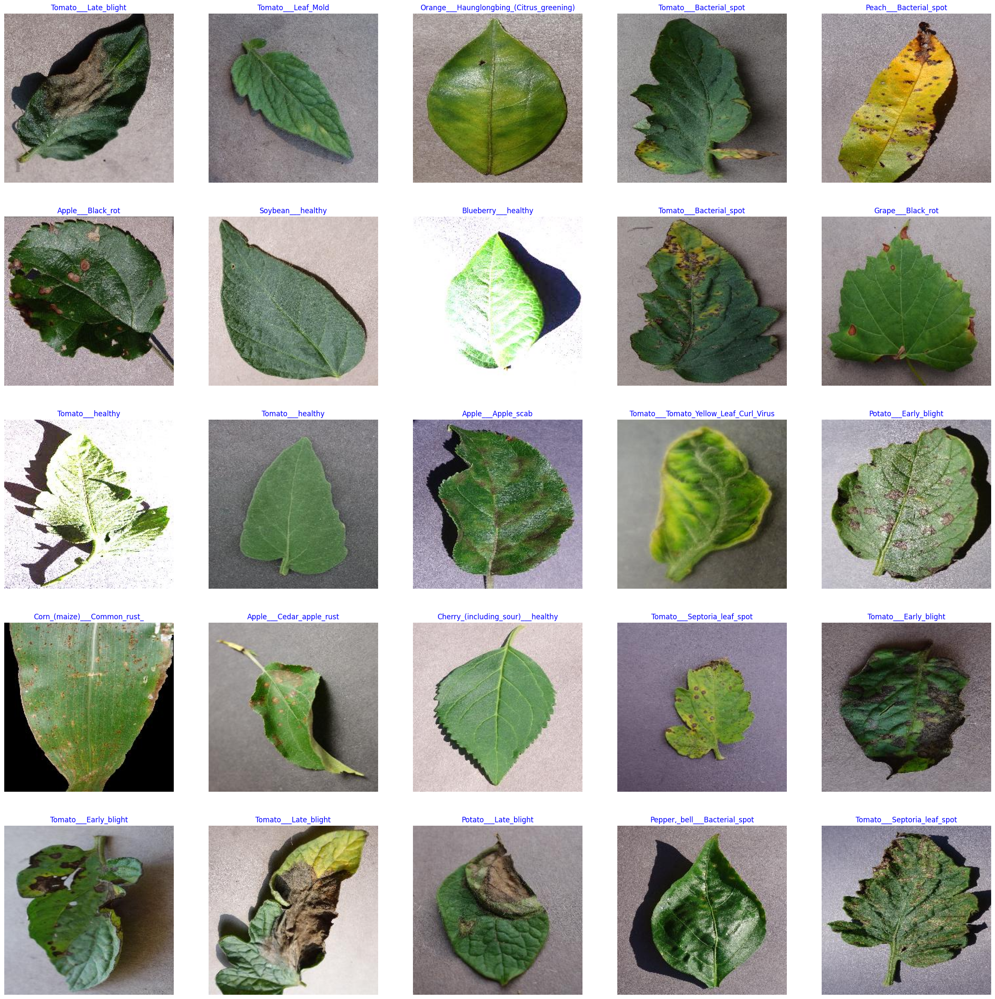

In [13]:
# Show sample images from 25 classes
def show_image_samples(gen):
    t_dict=gen.class_indices
    classes=list(t_dict.keys())
    images,labels=next(gen) # get a sample batch from the generator 
    plt.figure(figsize=(30, 30))
    length=len(labels)
    if length<25:   #show maximum of 25 images
        r=length
    else:
        r=25
    for i in range(r):        
        plt.subplot(5, 5, i + 1)
        image=images[i]      
        plt.imshow((image * 255).astype(np.uint8))
        index=np.argmax(labels[i])
        class_name=classes[index]
        plt.title(class_name, color='blue', fontsize=12)
        plt.axis('off')
    plt.show()
    
print("----------------------------Sample Images from Training Set-------------------------------------")
show_image_samples(train_generator )
print("----------------------------Sample Images from Validation Set-------------------------------------")
show_image_samples(validation_generator)

# Model Training

In [15]:
# Number of classes
num_classes = len(train_generator.class_indices)
num_classes

38

In [16]:
# Define the model
def build_model(hp):
    model = Sequential()
    model.add(Conv2D(filters=hp.Int('conv_1_filter', min_value=32, max_value=64, step=32),
                     kernel_size=hp.Choice('conv_1_kernel', values = [3]),
                     activation='relu',
                     input_shape=(256,256,3)))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Conv2D(filters=hp.Int('conv_2_filter', min_value=64, max_value=96, step=32),
                 kernel_size=hp.Choice('conv_2_kernel', values = [3]),
                 activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Conv2D(filters=hp.Int('conv_3_filter', min_value=96, max_value=128, step=32),
                 kernel_size=hp.Choice('conv_3_kernel', values = [3]),
                 activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Flatten())
    model.add(Dense(units=hp.Int('dense_1_units', min_value=64, max_value=128, step=32),
                    activation='relu'))
    model.add(Dropout(rate=hp.Float('dropout_1', min_value=0.1, max_value=0.3, default=0.1, step=0.10)))
    model.add(Dense(num_classes, activation='softmax'))

    model.compile(optimizer=tf.keras.optimizers.Adam(hp.Choice('learning_rate', values=[0.01, 0.001, 0.002])),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    
    return model

# Perform hyperparameter tuning
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials = 5,
    executions_per_trial = 1,
    directory = 'output',
    project_name = 'PhytoPhinder: The Leaf Disease Detective'
)

tuner.search_space_summary()

# Define the EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_accuracy', patience=2)

tuner.search(
    train_generator,
    epochs=10,
    validation_data=validation_generator,
    callbacks=[early_stopping]
)

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The hyperparameter search is complete. The optimal number of units in the first densely-connected
layer is {best_hps.get('dense_1_units')} and the optimal learning rate for the optimizer
is {best_hps.get('learning_rate')}.
""")

Trial 1 Complete [03h 07m 04s]
val_accuracy: 0.9445708990097046

Best val_accuracy So Far: 0.9445708990097046
Total elapsed time: 03h 07m 04s

The hyperparameter search is complete. The optimal number of units in the first densely-connected
layer is 128 and the optimal learning rate for the optimizer
is 0.001.



In [17]:
# Build the model with the optimal hyperparameters
model = tuner.hypermodel.build(best_hps)
# model = load_model('best_model.h5')

# Retrain the model
history = model.fit(train_generator, epochs = 10, validation_data = validation_generator)

# Save the model
model.save('best_model.h5')

Epoch 1/10
2197/2197 [==============================] - 1111s 505ms/step - loss: 1.2524 - accuracy: 0.6325 - val_loss: 0.5150 - val_accuracy: 0.8387
Epoch 2/10
2197/2197 [==============================] - 1052s 479ms/step - loss: 0.4914 - accuracy: 0.8430 - val_loss: 0.3714 - val_accuracy: 0.8817
Epoch 3/10
2197/2197 [==============================] - 1057s 481ms/step - loss: 0.3607 - accuracy: 0.8847 - val_loss: 0.2485 - val_accuracy: 0.9188
Epoch 4/10
2197/2197 [==============================] - 1072s 488ms/step - loss: 0.2970 - accuracy: 0.9037 - val_loss: 0.2170 - val_accuracy: 0.9295
Epoch 5/10
2197/2197 [==============================] - 1104s 502ms/step - loss: 0.2540 - accuracy: 0.9178 - val_loss: 0.4815 - val_accuracy: 0.8762
Epoch 6/10
2197/2197 [==============================] - 1084s 493ms/step - loss: 0.2343 - accuracy: 0.9250 - val_loss: 0.2565 - val_accuracy: 0.9205
Epoch 7/10
2197/2197 [==============================] - 1074s 489ms/step - loss: 0.2151 - accuracy: 0.9312

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# Prediction

In [18]:
# Load the best model
best_model = load_model('best_model.h5')

In [20]:
t_dict = train_generator.class_indices
classes = list(t_dict.keys())
# Load an image for prediction
img_path = '/kaggle/input/images-for-test/images_for_test/TomatoYellowCurlVirus5.JPG'  # Provide the path to your image
img = image.load_img(img_path, target_size=(256, 256))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0

# Get the predictions
predictions = best_model.predict(img_array)

# Assuming it's a multiclass classification, you can get the class with the highest probability
predicted_class = np.argmax(predictions)

# Print the result
print(f'Predicted class: {predicted_class}, {classes[predicted_class]}')

1/1 [==============================] - 0s 20ms/step
Predicted class: 35, Tomato___Tomato_Yellow_Leaf_Curl_Virus
